### First task:

Draw a green rectangular box to show a region of interest (ROI) around the main body of text in the middle of the image. Save this as __image_with_ROI.jpg__.

In [1]:
#Loading packages:
import os 
import sys
sys.path.append(os.path.join(".."))
import cv2
import numpy as np
from utils.imutils import jimshow
from utils.imutils import jimshow_channel
import matplotlib.pyplot as plt

In [2]:
#Loading data:
fname = os.path.join("..","data","img", "WHTT.jpg")

In [3]:
#Reading the "WHTT.jpg"-file and saving it as 'image':
image = cv2.imread(fname)

In [ ]:
#Printing image (as a sanity check to ensure that it is loaded correctly):
jimshow(image) #Output left out of notebook due to filesize constraints on github.

In [4]:
#Printing image shape to know which ballpark i need my rectangle to be within:
image.shape #Note that the following output is height, width (opposite of what is expected).

(3240, 4320, 3)

In [5]:
#Draw green box (start- and end coordinates are estimated through trial and error)
cv2.rectangle(image, (1370,880), (2890,2800), (0,255,0), 2) #Arguments: Specify image, start coordinates (x, y), end coordinates (x, y), color (BGR), line thickness.

array([[[144, 165, 173],
        [144, 165, 173],
        [145, 166, 174],
        ...,
        [139, 136, 131],
        [139, 136, 131],
        [138, 135, 130]],

       [[147, 168, 176],
        [147, 168, 176],
        [146, 167, 175],
        ...,
        [139, 136, 131],
        [140, 137, 132],
        [140, 137, 132]],

       [[148, 169, 177],
        [147, 168, 176],
        [145, 166, 174],
        ...,
        [138, 135, 130],
        [139, 136, 131],
        [140, 137, 132]],

       ...,

       [[128, 126, 125],
        [126, 124, 123],
        [125, 123, 122],
        ...,
        [160, 155, 152],
        [162, 157, 154],
        [159, 154, 151]],

       [[128, 126, 125],
        [125, 123, 122],
        [123, 121, 120],
        ...,
        [160, 155, 152],
        [159, 154, 151],
        [156, 151, 148]],

       [[127, 125, 124],
        [124, 122, 121],
        [121, 119, 118],
        ...,
        [161, 156, 153],
        [159, 154, 151],
        [158, 153, 150]]

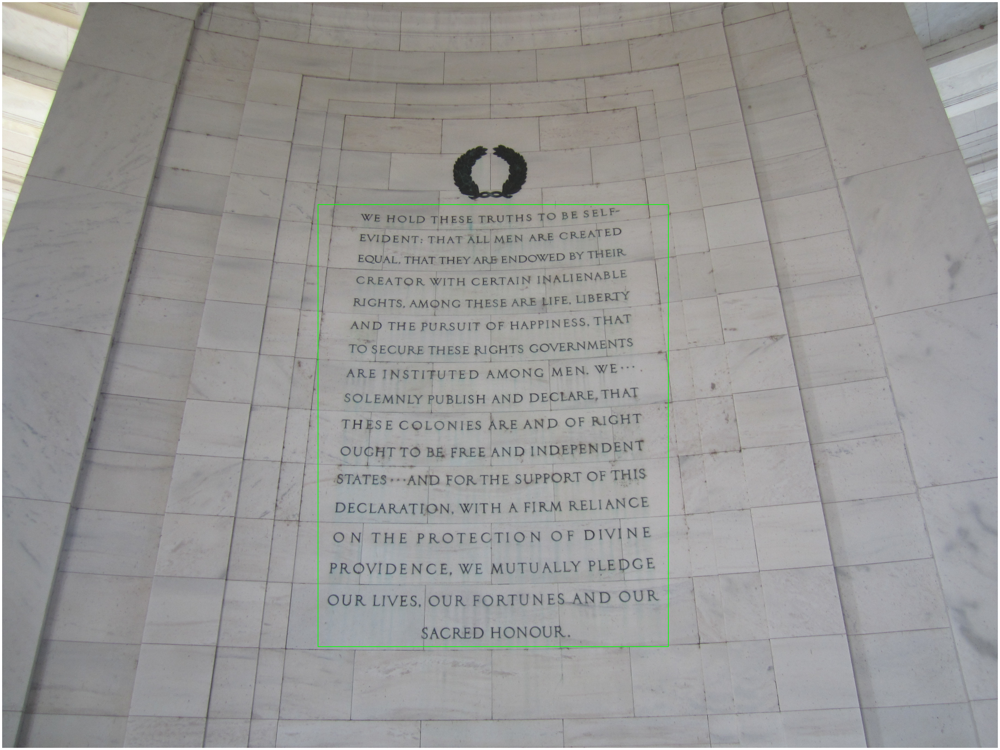

In [6]:
#Printing square-image:
jimshow(image)

In [7]:
#Saving image.
filepath, _ = os.path.split(fname) #Taking the first part of the filepath for the original image and save it as filepath.
outfile = os.path.join(filepath, "image_with_ROI.jpg") #Specify that I want the new file to be named "image_with_ROI.jpg".

In [8]:
#Write "image" as specified in "outfile":
cv2.imwrite(outfile, image) 

True

# Task 2

__Crop the original image to create a new image containing only the ROI in the rectangle. Save this as image_cropped.jpg.__

In [9]:
#Load the original again (to remove the green box):
image = cv2.imread(fname)

In [10]:
#Index the image according to the coordinates specified in the cv2.rectangle function:
image_cropped = image[880:2800,1370:2890,] #Note that the height and width are specified opposite, compared to cv2.

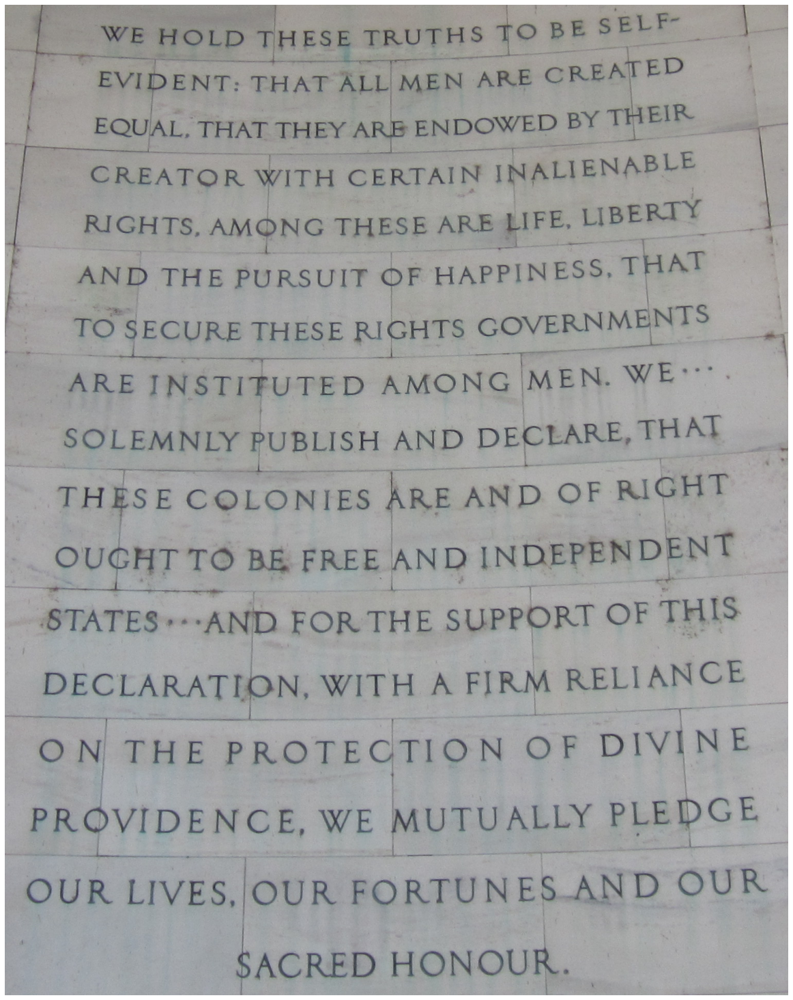

In [11]:
#Plot the cropped image (sanity check):
jimshow(image_cropped)

In [12]:
#Saving image.
filepath, _ = os.path.split(fname) #Taking the first part of the filepath for the original image and save it as filepath.
outfile = os.path.join(filepath, "image_cropped.jpg") #Specify that I want the new file to be named "image_cropped.jpg".

In [13]:
#Write "image" as specified in "outfile":
cv2.imwrite(outfile, image_cropped) 

True

# Task 3

__Using this cropped image, use Canny edge detection to 'find' every letter in the image__

In [14]:
#Make the image greyscale (for Canny edge detection):
grey_image = cv2.cvtColor(image_cropped, cv2.COLOR_BGR2GRAY)

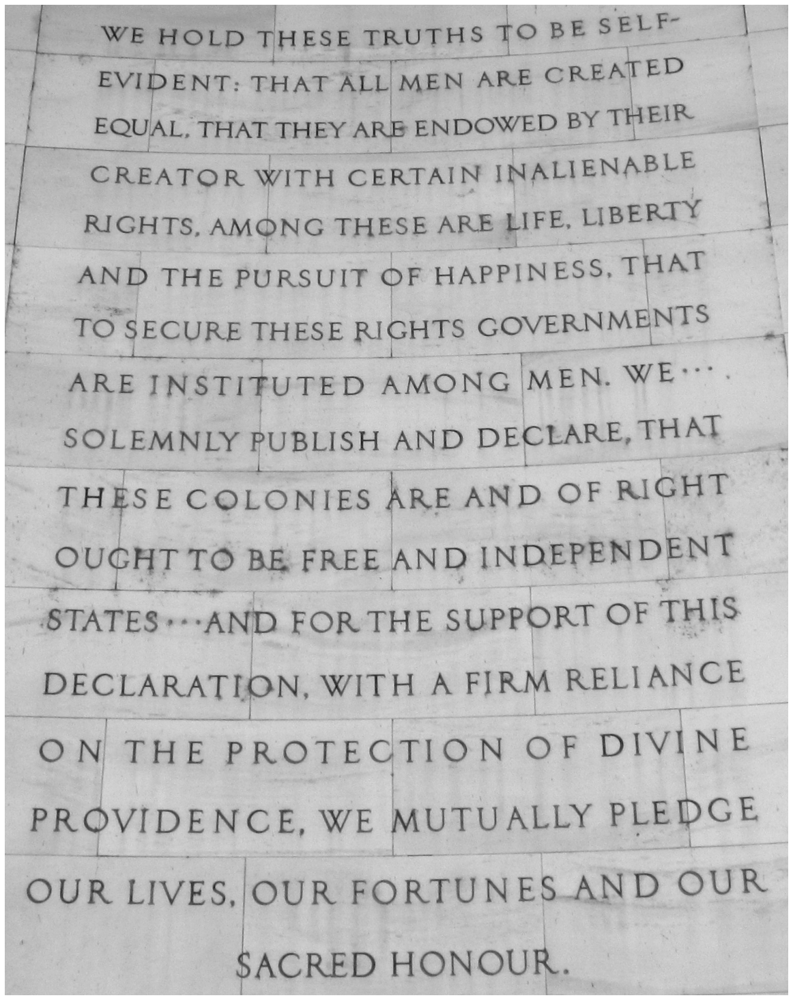

In [15]:
#Plot the image to ensure that the transformation worked (sanity check).
jimshow_channel(grey_image)

In [16]:
#Blur the image
blurred = cv2.GaussianBlur(grey_image, (5,5), 0)

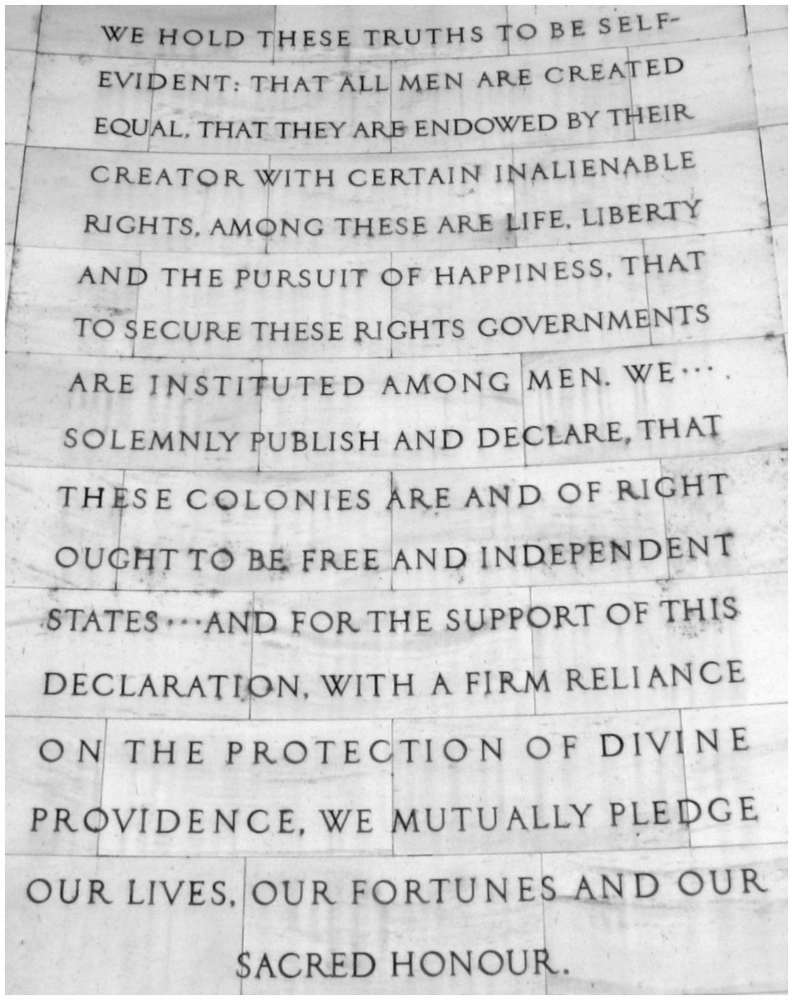

In [17]:
#Plot the image to ensure that the transformation worked (sanity check).
jimshow_channel(blurred)

In [18]:
#Use canny edge detection:
canny = cv2.Canny(blurred, 80, 150) #Parameters specified through trial and error.

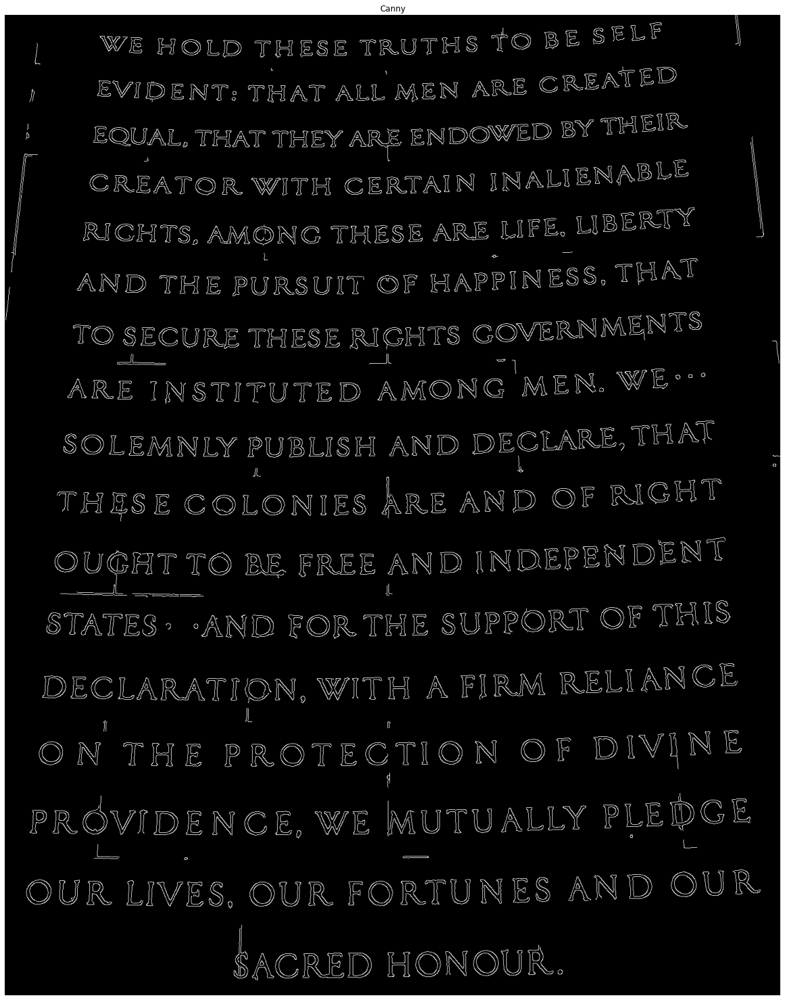

In [19]:
#Plot the image to ensure that the transformation worked (sanity check).
jimshow_channel(canny, "Canny")

# Task 4

__Draw a green contour around each letter in the cropped image. Save this as image_letters.jpg__

In [20]:
#Find controus and save them as "contours":
(contours, _) = cv2.findContours(canny.copy(), 
                 cv2.RETR_EXTERNAL,
                 cv2.CHAIN_APPROX_SIMPLE)

In [21]:
#Draw contours on cropped image and save the new image as "image_contour":
image_contour = cv2.drawContours(image_cropped.copy(), #Draw contours on copy of original image
                                   contours, #our list of contours
                                   -1, #Which contours to draw
                                   (0,0,200), #Contour colout
                                   2) #contour pixel width

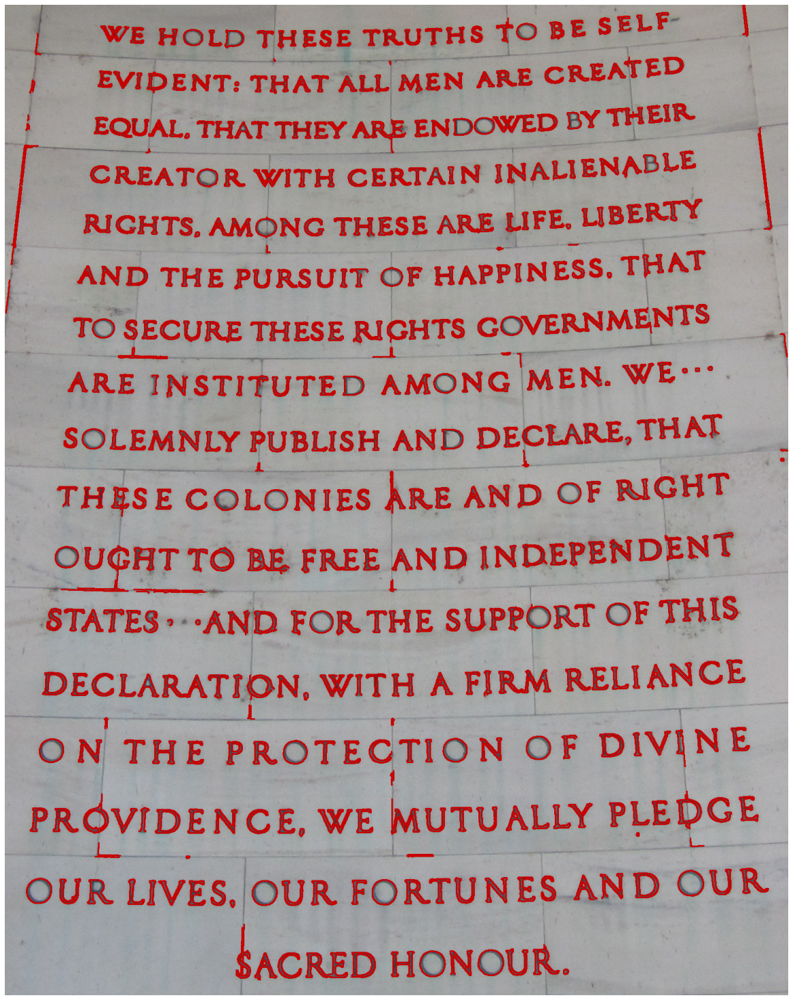

In [22]:
#Pring "image_contour" to ensure that the transformation was done correctly (sanity check):
jimshow(image_contour)

In [23]:
#Saving image.
filepath, _ = os.path.split(fname)
outfile = os.path.join(filepath, "image_letters.jpg")

In [24]:
cv2.imwrite(outfile, image_contour)

True